<a href="https://www.kaggle.com/code/lalit7881/gaming-vs-academic-prediction-eda-88-94?scriptVersionId=317618429" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/nalisha/gaming-vs-academic-performance/Gaming_Academic_Performance.csv


## Loading dataset

In [2]:
df = pd.read_csv("/kaggle/input/datasets/nalisha/gaming-vs-academic-performance/Gaming_Academic_Performance.csv")

## top 5 values

In [3]:
df.head()

,student_id,age,gender,gaming_hours,study_hours,sleep_hours,attendance,gaming_genre,social_activity,device_usage,reaction_time_ms,addiction_score,stress_level,grades
0,1,22,Male,7.23,8.78,6.96,91.44,FPS,3.25,9.36,235.84,14.69,Low,86.459555
1,2,19,Male,0.07,8.72,7.63,63.63,Casual,1.02,3.21,328.71,2.47,Medium,98.230000
2,3,23,Female,1.73,9.56,4.40,83.26,Casual,3.46,5.56,313.61,4.73,High,90.560000
3,4,20,Female,6.62,1.68,7.83,75.04,RPG,1.46,11.78,241.84,14.54,Low,32.670000
4,5,22,Female,5.36,5.83,5.55,65.57,FPS,1.01,8.23,249.31,12.48,Low,58.710000


In [4]:
df.tail()

,student_id,age,gender,gaming_hours,study_hours,sleep_hours,attendance,gaming_genre,social_activity,device_usage,reaction_time_ms,addiction_score,stress_level,grades
7995,7996,24,Male,6.33,5.09,4.83,63.74,FPS,4.11,9.96,231.33,11.14,Low,35.11
7996,7997,22,Female,5.77,6.09,6.23,84.37,FPS,3.42,11.19,254.13,10.66,Low,60.80
7997,7998,20,Male,2.87,8.51,8.62,67.30,FPS,2.36,6.40,305.00,6.42,Medium,90.28
7998,7999,22,Female,0.98,2.99,7.29,61.13,FPS,2.02,4.57,325.36,2.14,Medium,56.33
7999,8000,18,Female,1.73,8.75,7.65,78.68,RPG,4.03,6.33,302.25,4.05,Medium,100.00


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   student_id        8000 non-null   int64  
 1   age               8000 non-null   int64  
 2   gender            8000 non-null   object 
 3   gaming_hours      8000 non-null   float64
 4   study_hours       8000 non-null   float64
 5   sleep_hours       8000 non-null   float64
 6   attendance        8000 non-null   float64
 7   gaming_genre      8000 non-null   object 
 8   social_activity   8000 non-null   float64
 9   device_usage      8000 non-null   float64
 10  reaction_time_ms  8000 non-null   float64
 11  addiction_score   8000 non-null   float64
 12  stress_level      8000 non-null   object 
 13  grades            8000 non-null   float64
dtypes: float64(9), int64(2), object(3)
memory usage: 875.1+ KB


In [6]:
df.describe()

,student_id,age,gaming_hours,study_hours,sleep_hours,attendance,social_activity,device_usage,reaction_time_ms,addiction_score,grades
count,8000.00000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,4000.50000,19.983625,4.085773,5.460581,6.493453,79.886525,2.507790,7.586315,271.105839,9.908492,66.180776
std,2309.54541,2.587072,2.308801,2.575787,1.442656,11.580419,1.441128,2.710035,29.440675,5.035837,22.422024
min,1.00000,16.000000,0.000000,1.000000,4.000000,60.000000,0.000000,1.100000,183.260000,-4.510000,0.000000
25%,2000.75000,18.000000,2.130000,3.240000,5.240000,69.780000,1.287500,5.560000,247.160000,5.920000,49.879843
50%,4000.50000,20.000000,4.130000,5.460000,6.505000,79.695000,2.500000,7.610000,270.475000,10.005000,67.070000
75%,6000.25000,22.000000,6.060000,7.660000,7.730000,90.100000,3.760000,9.600000,294.690000,13.860000,83.992223
max,8000.00000,24.000000,8.000000,10.000000,9.000000,100.000000,5.000000,13.950000,347.870000,23.160000,118.632936


In [7]:
df.isnull().sum()

student_id          0
age                 0
gender              0
gaming_hours        0
study_hours         0
sleep_hours         0
attendance          0
gaming_genre        0
social_activity     0
device_usage        0
reaction_time_ms    0
addiction_score     0
stress_level        0
grades              0
dtype: int64

In [8]:
df.isnull()

,student_id,age,gender,gaming_hours,study_hours,sleep_hours,attendance,gaming_genre,social_activity,device_usage,reaction_time_ms,addiction_score,stress_level,grades
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7996,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7997,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7998,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [9]:
df. duplicated().sum()

np.int64(0)

In [10]:
df.dtypes

student_id            int64
age                   int64
gender               object
gaming_hours        float64
study_hours         float64
sleep_hours         float64
attendance          float64
gaming_genre         object
social_activity     float64
device_usage        float64
reaction_time_ms    float64
addiction_score     float64
stress_level         object
grades              float64
dtype: object

In [11]:
df.shape

(8000, 14)

In [12]:
df.columns

Index(['student_id', 'age', 'gender', 'gaming_hours', 'study_hours',
       'sleep_hours', 'attendance', 'gaming_genre', 'social_activity',
       'device_usage', 'reaction_time_ms', 'addiction_score', 'stress_level',
       'grades'],
      dtype='object')

## EDA

In [13]:
print(df.head())

   student_id  age  gender  gaming_hours  study_hours  sleep_hours  \
0           1   22    Male          7.23         8.78         6.96   
1           2   19    Male          0.07         8.72         7.63   
2           3   23  Female          1.73         9.56         4.40   
3           4   20  Female          6.62         1.68         7.83   
4           5   22  Female          5.36         5.83         5.55   

   attendance gaming_genre  social_activity  device_usage  reaction_time_ms  \
0       91.44          FPS             3.25          9.36            235.84   
1       63.63       Casual             1.02          3.21            328.71   
2       83.26       Casual             3.46          5.56            313.61   
3       75.04          RPG             1.46         11.78            241.84   
4       65.57          FPS             1.01          8.23            249.31   

   addiction_score stress_level     grades  
0            14.69          Low  86.459555  
1             

In [14]:
sns.set_style("whitegrid")

In [15]:
plt.rcParams['figure.figsize'] = (15,8)

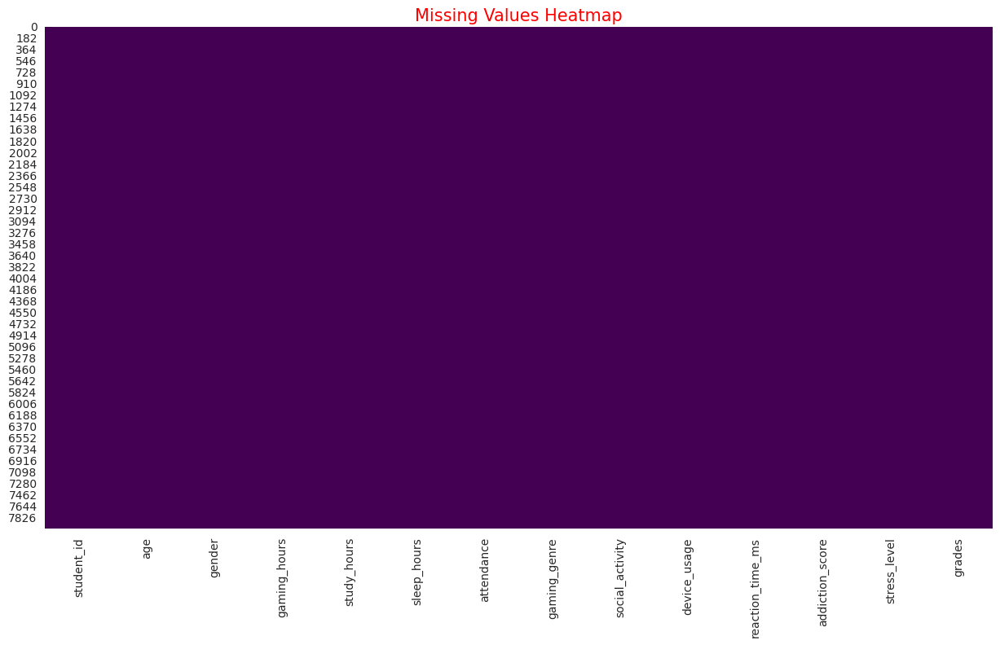

In [16]:
plt.figure(figsize=(15,8))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap", fontsize=15, color='Red')
plt.show()

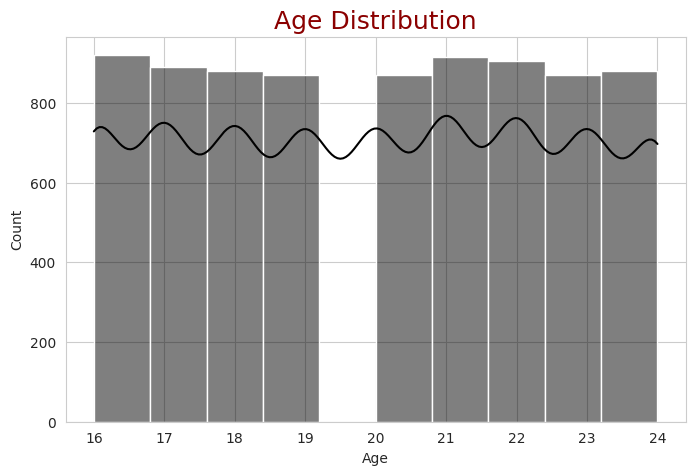

In [17]:
plt.figure(figsize=(8,5))
sns.histplot(df['age'], bins=10, kde=True, color='black')
plt.title("Age Distribution", fontsize=18, color='darkred')
plt.xlabel("Age")
plt.ylabel("Count")
plt.show()

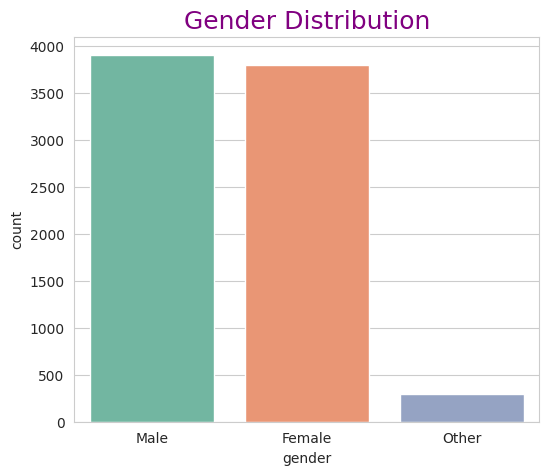

In [18]:
plt.figure(figsize=(6,5))
sns.countplot(x='gender', data=df, palette='Set2')
plt.title("Gender Distribution", fontsize=18, color='purple')
plt.show()


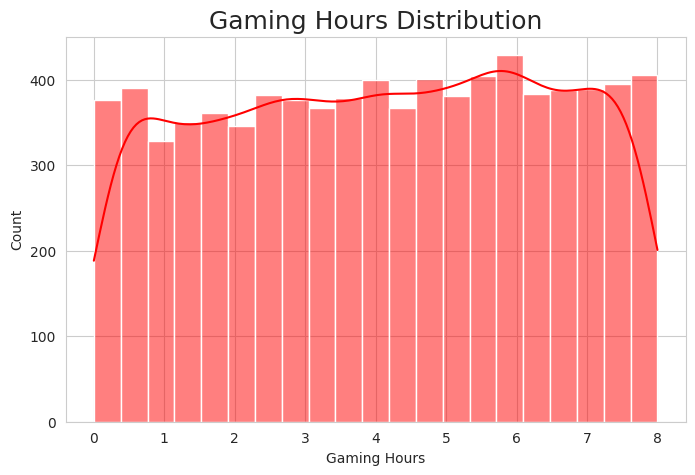

In [19]:
plt.figure(figsize=(8,5))
sns.histplot(df['gaming_hours'], kde=True, color='red')
plt.title("Gaming Hours Distribution", fontsize=18)
plt.xlabel("Gaming Hours")
plt.show()

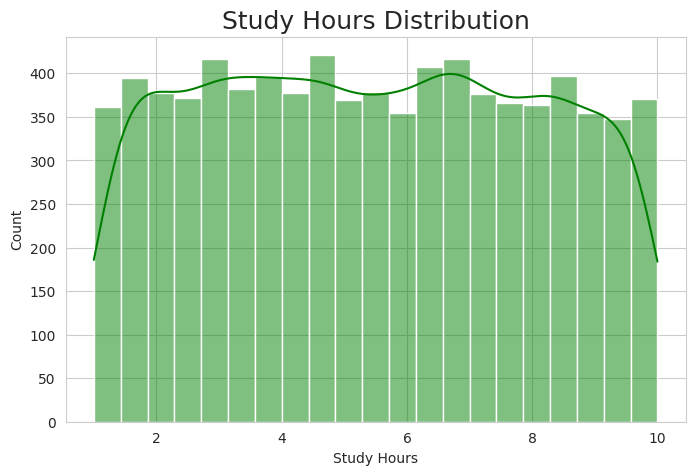

In [20]:
plt.figure(figsize=(8,5))
sns.histplot(df['study_hours'], kde=True, color='green')
plt.title("Study Hours Distribution", fontsize=18)
plt.xlabel("Study Hours")
plt.show()


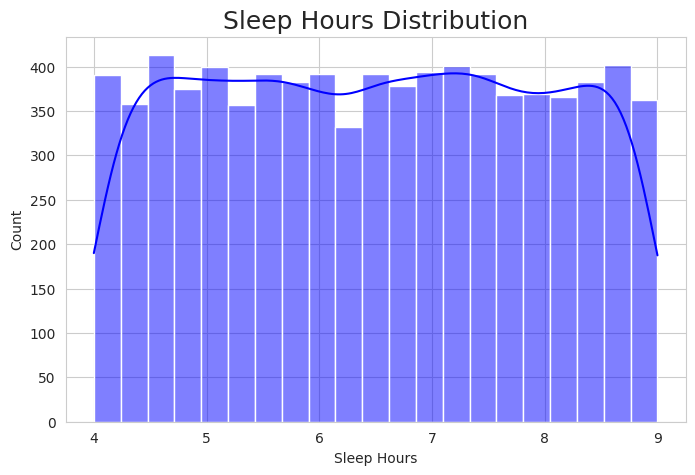

In [21]:
plt.figure(figsize=(8,5))
sns.histplot(df['sleep_hours'], kde=True, color='blue')
plt.title("Sleep Hours Distribution", fontsize=18)
plt.xlabel("Sleep Hours")
plt.show()


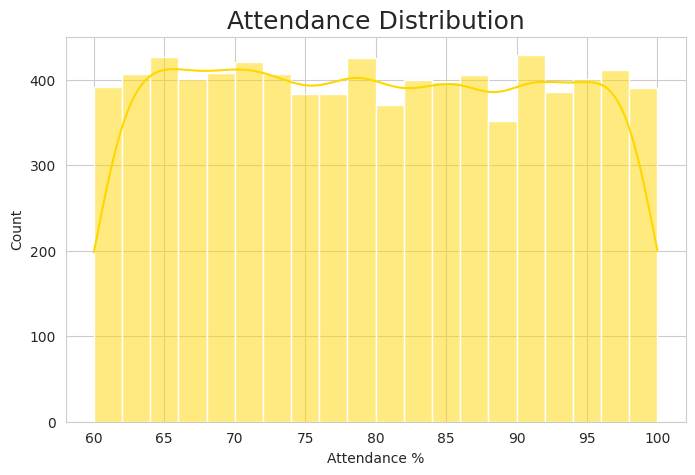

In [22]:
plt.figure(figsize=(8,5))
sns.histplot(df['attendance'], kde=True, color='gold')
plt.title("Attendance Distribution", fontsize=18)
plt.xlabel("Attendance %")
plt.show()


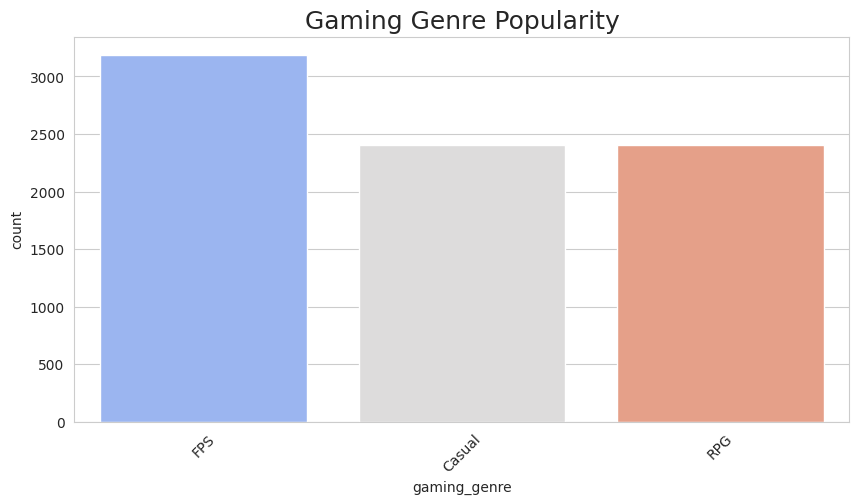

In [23]:
plt.figure(figsize=(10,5))
sns.countplot(x='gaming_genre', data=df, palette='coolwarm')
plt.title("Gaming Genre Popularity", fontsize=18)
plt.xticks(rotation=45)
plt.show()


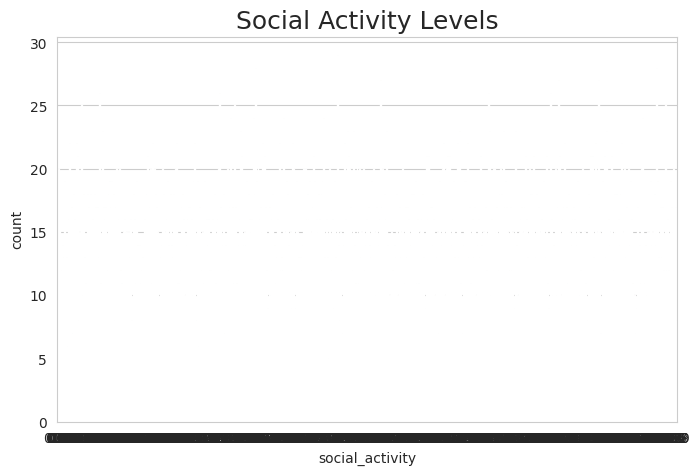

In [24]:
plt.figure(figsize=(8,5))
sns.countplot(x='social_activity', data=df, palette='pastel')
plt.title("Social Activity Levels", fontsize=18)
plt.show()

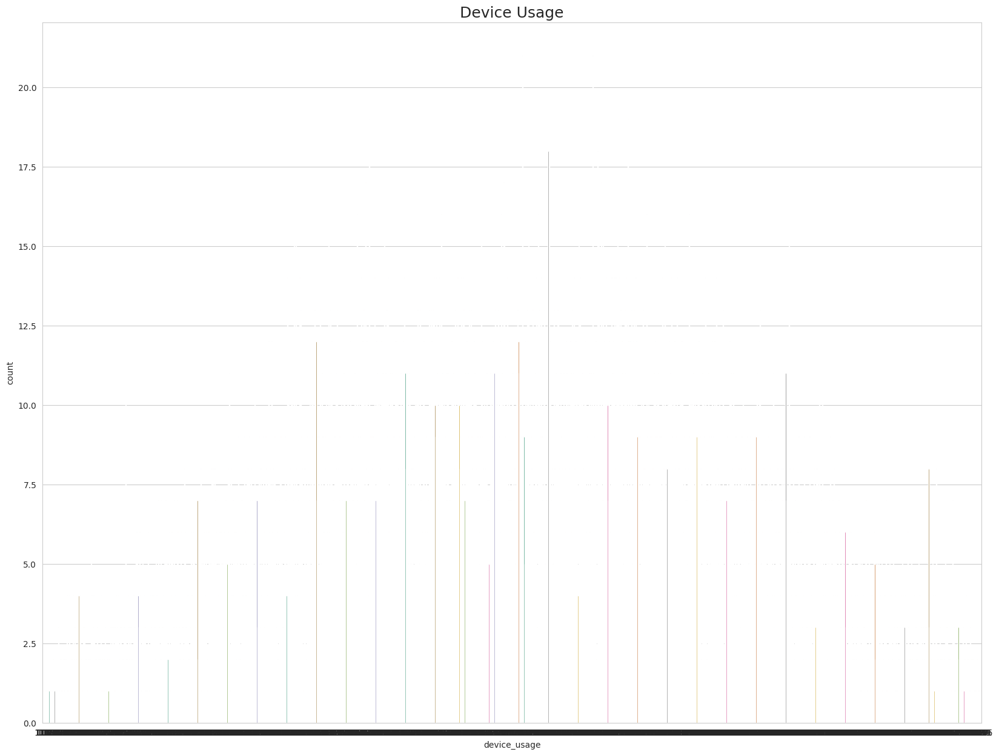

In [25]:
plt.figure(figsize=(20,15))
sns.countplot(x='device_usage', data=df, palette='Dark2')
plt.title("Device Usage", fontsize=18)
plt.show()


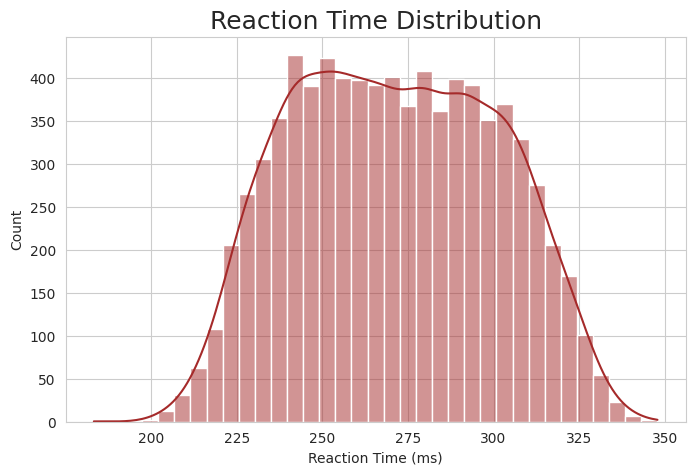

In [26]:
plt.figure(figsize=(8,5))
sns.histplot(df['reaction_time_ms'], kde=True, color='brown')
plt.title("Reaction Time Distribution", fontsize=18)
plt.xlabel("Reaction Time (ms)")
plt.show()


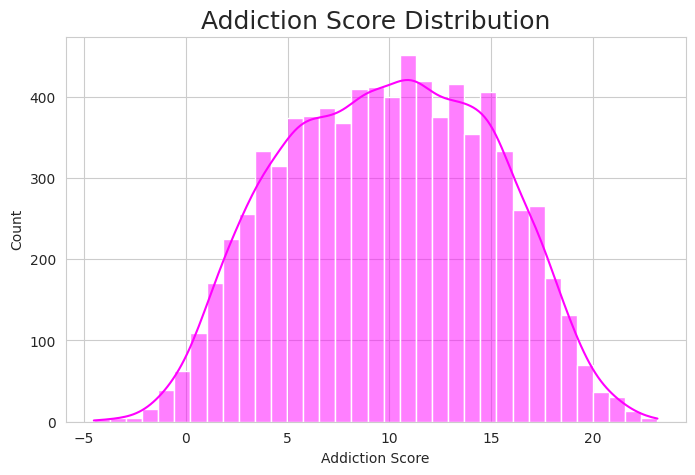

In [27]:
plt.figure(figsize=(8,5))
sns.histplot(df['addiction_score'], kde=True, color='magenta')
plt.title("Addiction Score Distribution", fontsize=18)
plt.xlabel("Addiction Score")
plt.show()


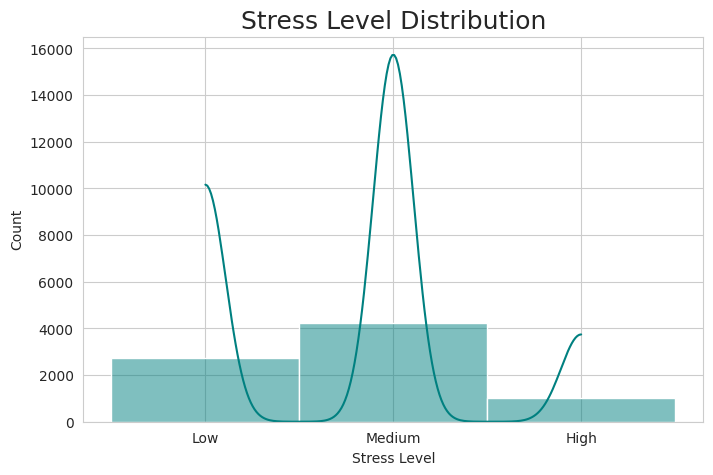

In [28]:
plt.figure(figsize=(8,5))
sns.histplot(df['stress_level'], kde=True, color='teal')
plt.title("Stress Level Distribution", fontsize=18)
plt.xlabel("Stress Level")
plt.show()

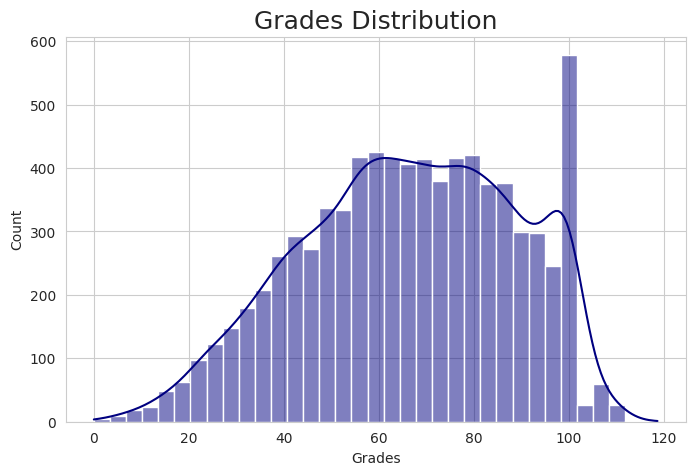

In [29]:
plt.figure(figsize=(8,5))
sns.histplot(df['grades'], kde=True, color='navy')
plt.title("Grades Distribution", fontsize=18)
plt.xlabel("Grades")
plt.show()

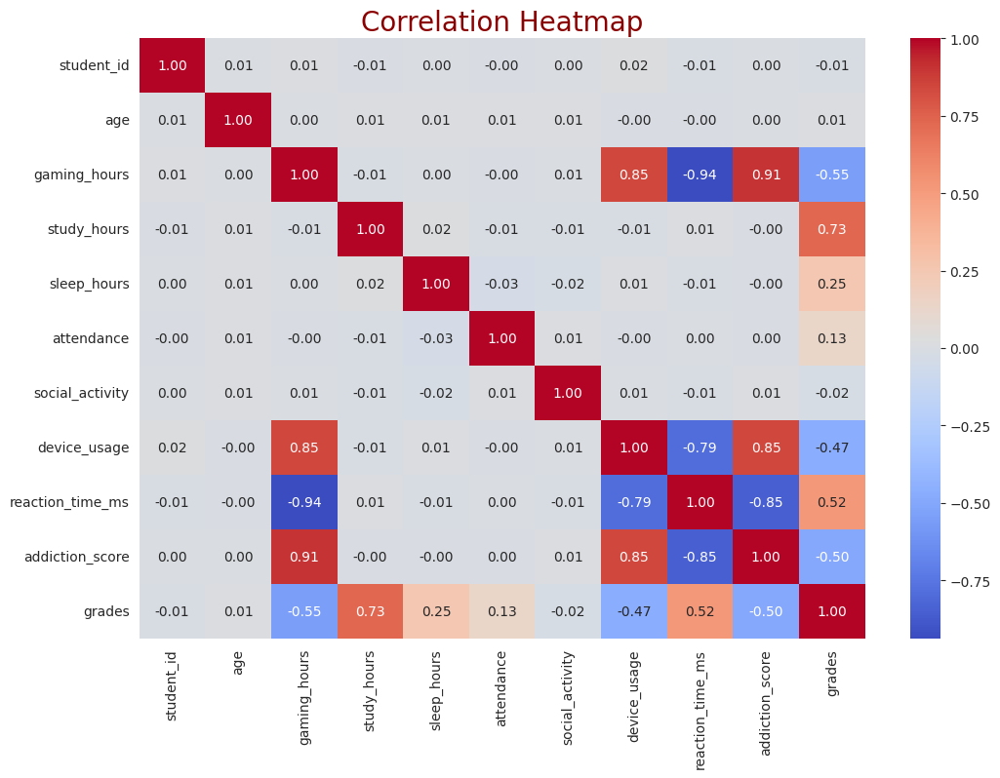

In [30]:
numeric_df = df.select_dtypes(include=np.number)

plt.figure(figsize=(12,8))
sns.heatmap(
    numeric_df.corr(),
    annot=True,
    cmap='coolwarm',
    fmt='.2f'
)

plt.title("Correlation Heatmap", fontsize=20, color='darkred')
plt.show()

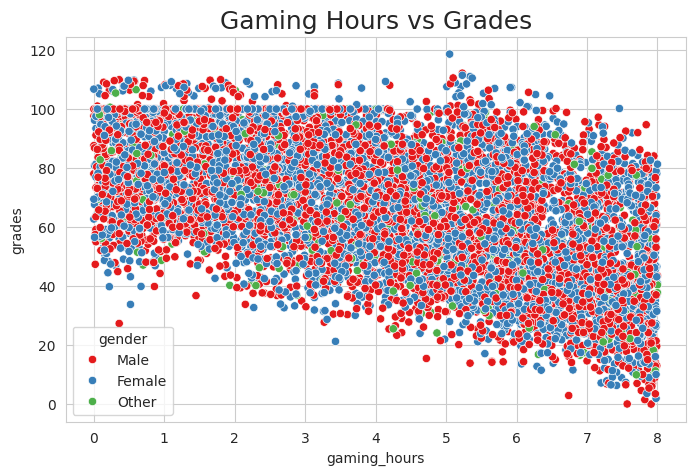

In [31]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x='gaming_hours',
    y='grades',
    hue='gender',
    palette='Set1',
    data=df
)

plt.title("Gaming Hours vs Grades", fontsize=18)
plt.show()


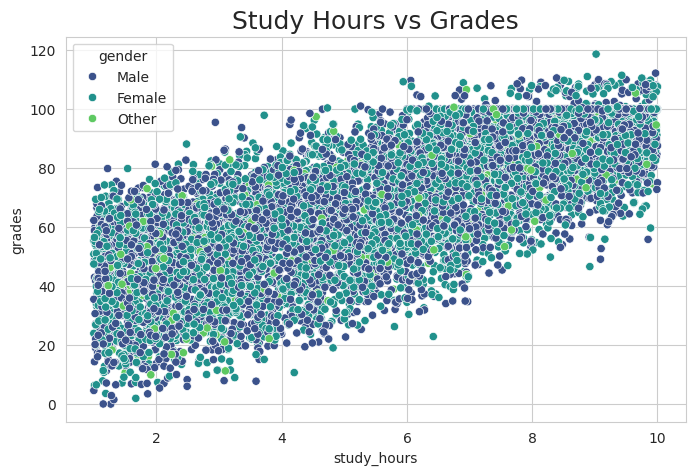

In [32]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x='study_hours',
    y='grades',
    hue='gender',
    palette='viridis',
    data=df
)

plt.title("Study Hours vs Grades", fontsize=18)
plt.show()

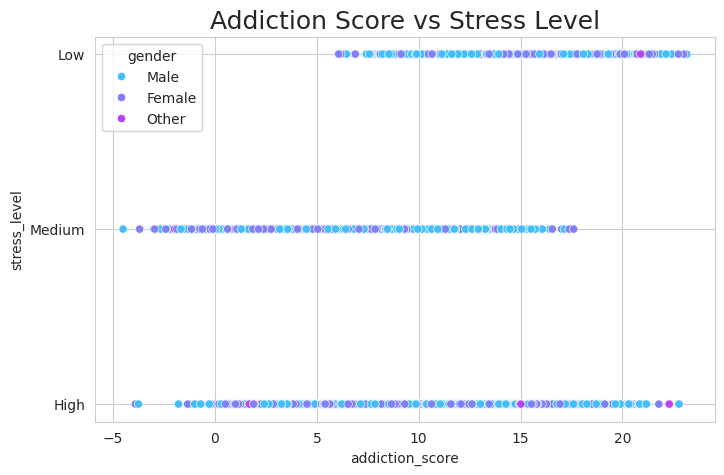

In [33]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x='addiction_score',
    y='stress_level',
    hue='gender',
    palette='cool',
    data=df
)

plt.title("Addiction Score vs Stress Level", fontsize=18)
plt.show()


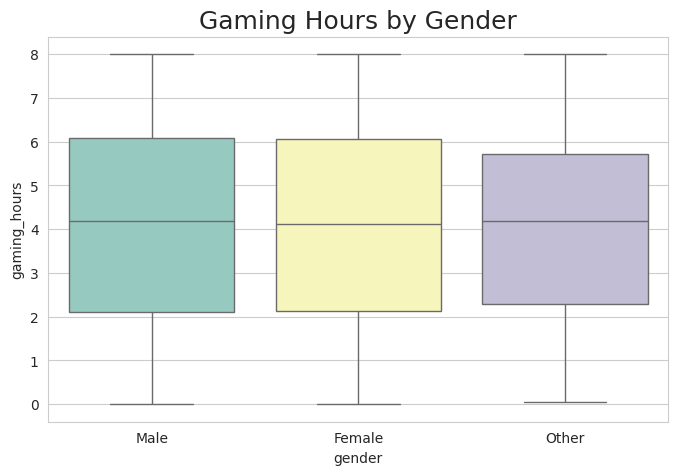

In [34]:
plt.figure(figsize=(8,5))
sns.boxplot(
    x='gender',
    y='gaming_hours',
    data=df,
    palette='Set3'
)

plt.title("Gaming Hours by Gender", fontsize=18)
plt.show()


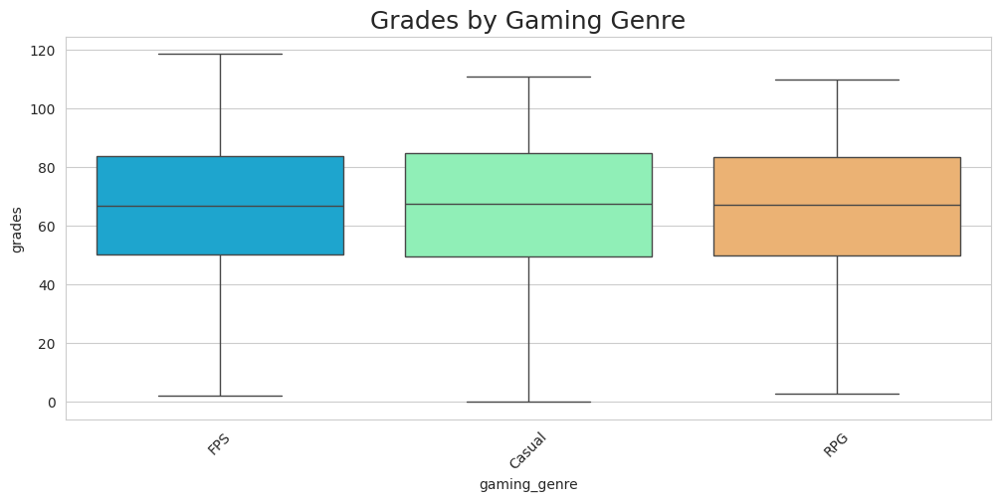

In [35]:

plt.figure(figsize=(12,5))
sns.boxplot(
    x='gaming_genre',
    y='grades',
    data=df,
    palette='rainbow'
)

plt.title("Grades by Gaming Genre", fontsize=18)
plt.xticks(rotation=45)
plt.show()

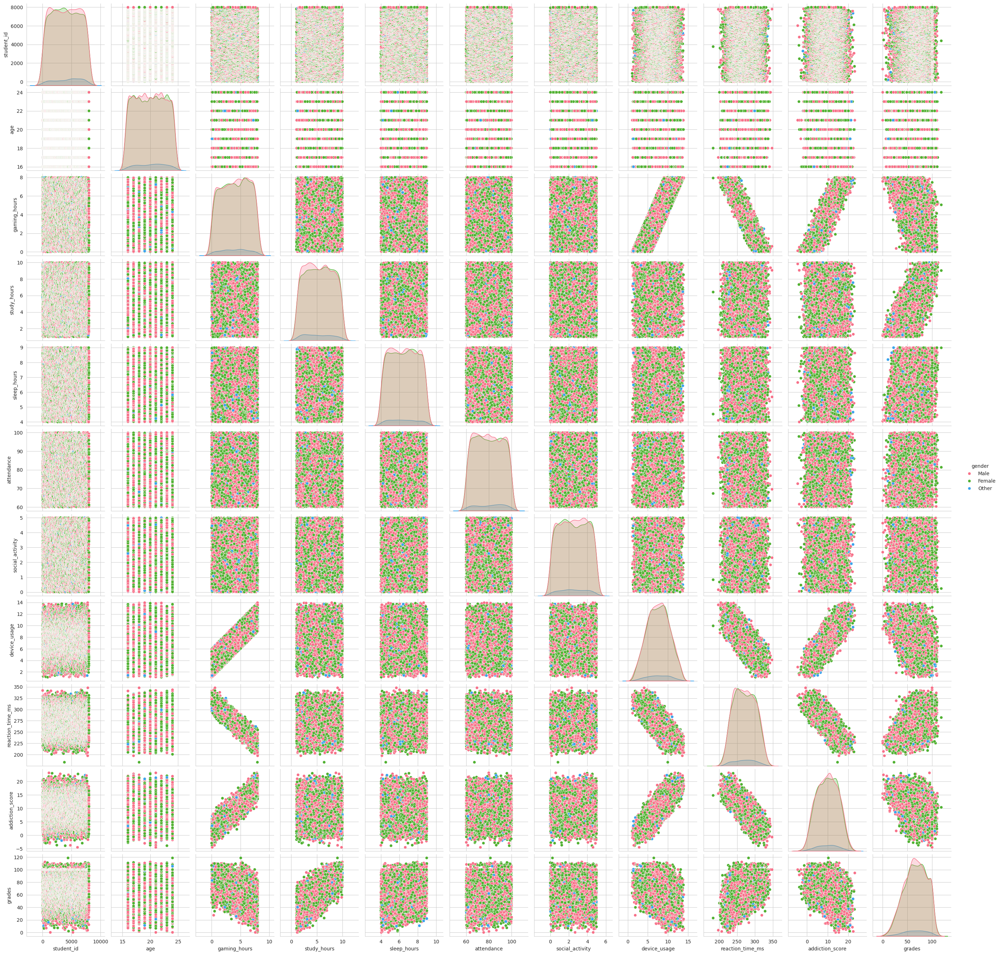

In [36]:
sns.pairplot(
    df,
    hue='gender',
    palette='husl'
)

plt.show()


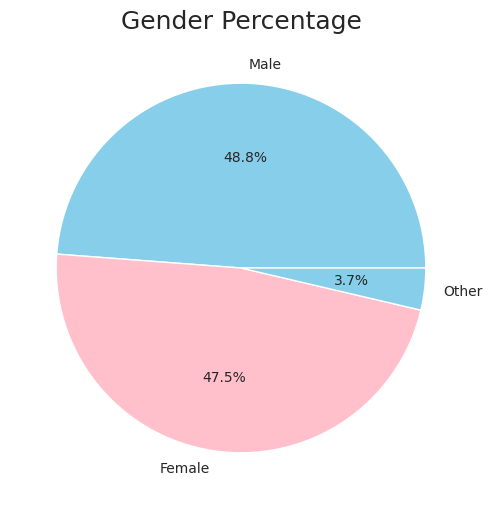

In [37]:
gender_counts = df['gender'].value_counts()

plt.figure(figsize=(6,6))
plt.pie(
    gender_counts,
    labels=gender_counts.index,
    autopct='%1.1f%%',
    colors=['skyblue', 'pink']
)

plt.title("Gender Percentage", fontsize=18)
plt.show()


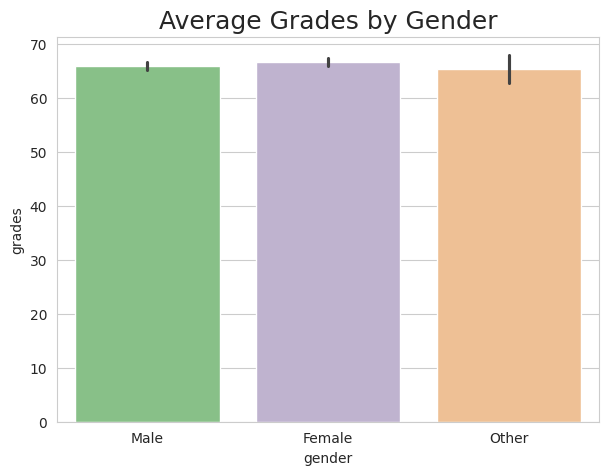

In [38]:
plt.figure(figsize=(7,5))
sns.barplot(
    x='gender',
    y='grades',
    data=df,
    palette='Accent'
)

plt.title("Average Grades by Gender", fontsize=18)
plt.show()

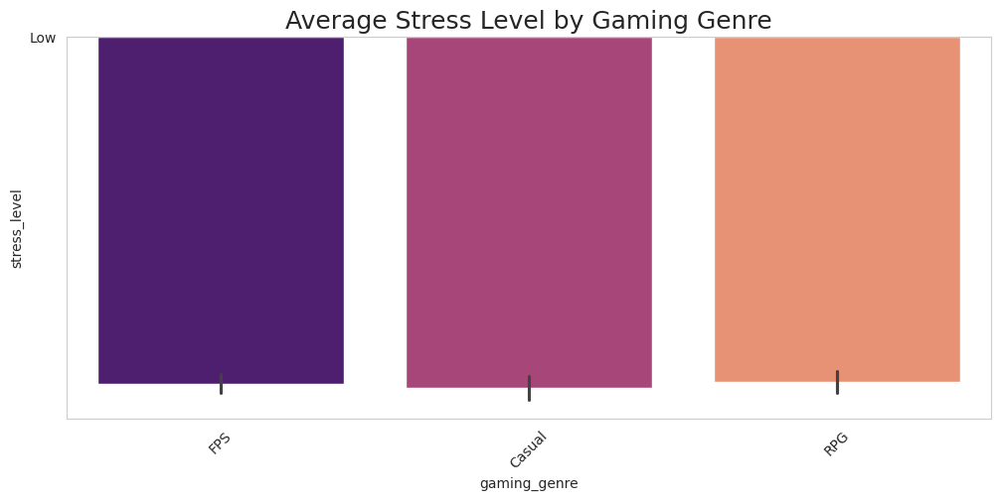

In [39]:
plt.figure(figsize=(12,5))
sns.barplot(
    x='gaming_genre',
    y='stress_level',
    data=df,
    palette='magma'
)

plt.title("Average Stress Level by Gaming Genre", fontsize=18)
plt.xticks(rotation=45)
plt.show()

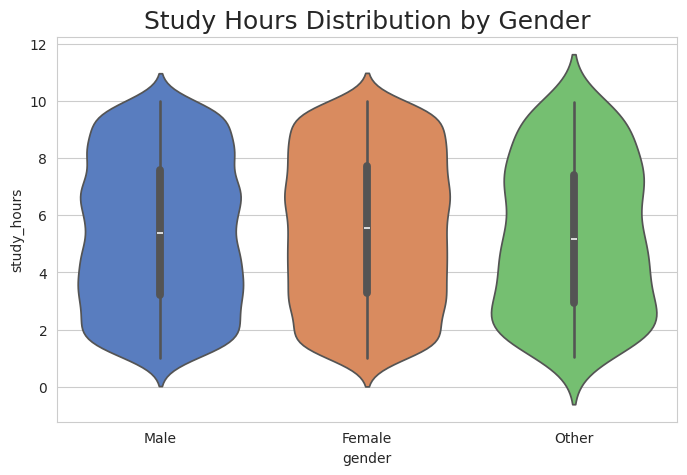

In [40]:
plt.figure(figsize=(8,5))
sns.violinplot(
    x='gender',
    y='study_hours',
    data=df,
    palette='muted'
)

plt.title("Study Hours Distribution by Gender", fontsize=18)
plt.show()

In [41]:
print ("\nAll Visualization of data is successfully submitted ")


All Visualization of data is successfully submitted 


## Feature engineering

In [42]:
# Sklearn
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# ML Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score


================ TARGET VALUE COUNTS ================

target
1    4000
0    4000
Name: count, dtype: int64

Categorical Columns:
 ['gender', 'gaming_genre', 'stress_level']

Numeric Columns:
 ['student_id', 'age', 'gaming_hours', 'study_hours', 'sleep_hours', 'attendance', 'social_activity', 'device_usage', 'reaction_time_ms', 'grades']

================ TRAIN TEST SPLIT ================

X_train Shape : (6400, 13)
X_test Shape  : (1600, 13)
y_train Shape : (6400,)
y_test Shape  : (1600,)


MODEL : Logistic Regression

Accuracy Score :
88.94 %

Classification Report :

              precision    recall  f1-score   support

           0       0.90      0.87      0.89       800
           1       0.88      0.91      0.89       800

    accuracy                           0.89      1600
   macro avg       0.89      0.89      0.89      1600
weighted avg       0.89      0.89      0.89      1600


Confusion Matrix :

[[699 101]
 [ 76 724]]

ROC AUC Score :
0.9639


MODEL : Decision Tree

Ac

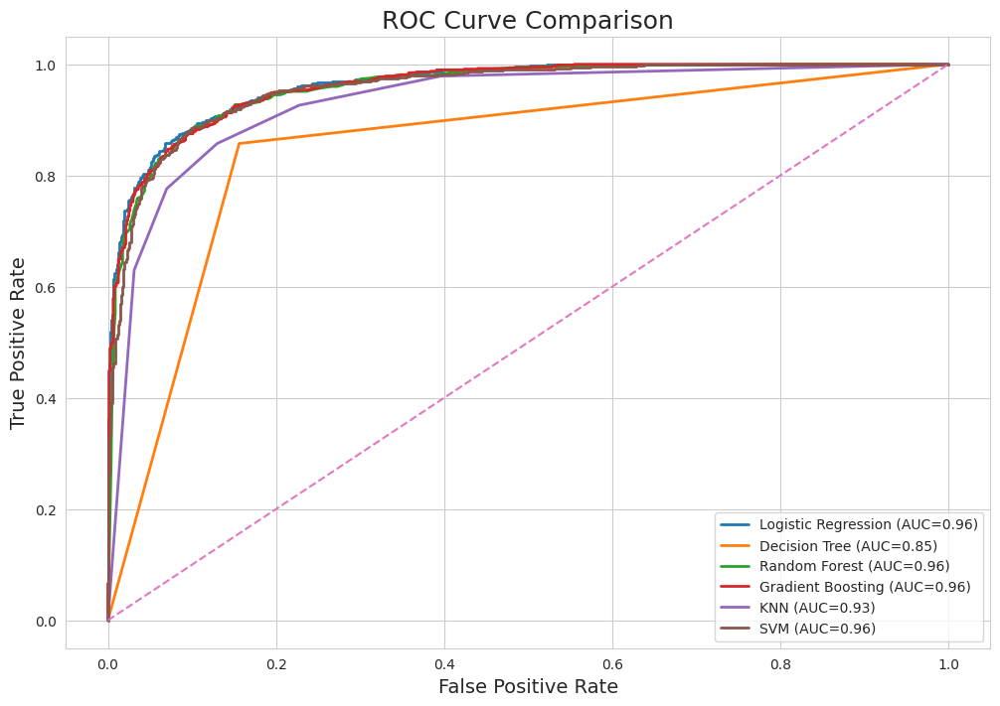



FINAL MODEL COMPARISON
                 Model  Accuracy   ROC_AUC
0  Logistic Regression  0.889375  0.963859
2        Random Forest  0.888125  0.958409
5                  SVM  0.887500  0.957116
3    Gradient Boosting  0.883750  0.960860
4                  KNN  0.863750  0.931130
1        Decision Tree  0.850625  0.850625


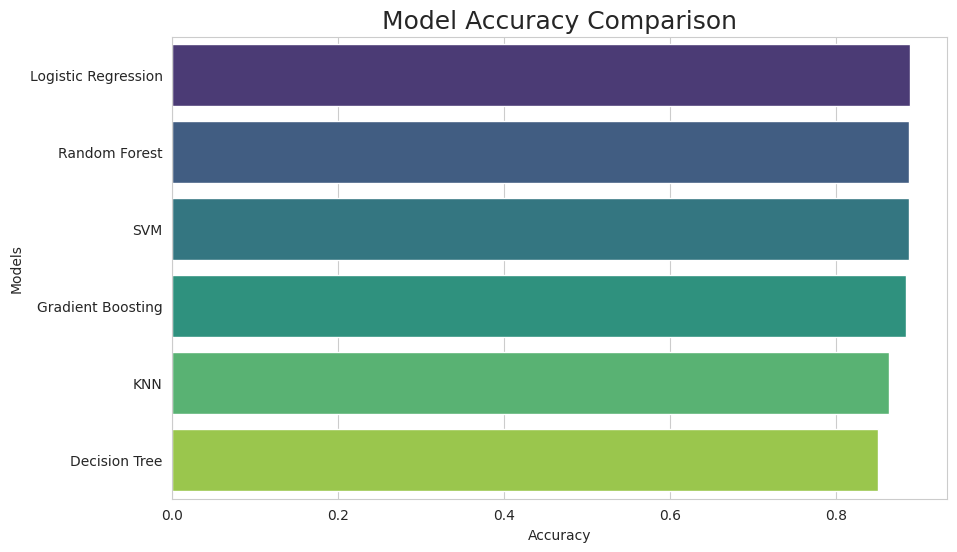



BEST MODEL
Model Name : Logistic Regression
Accuracy   : 88.94 %
ROC AUC    : 0.9639


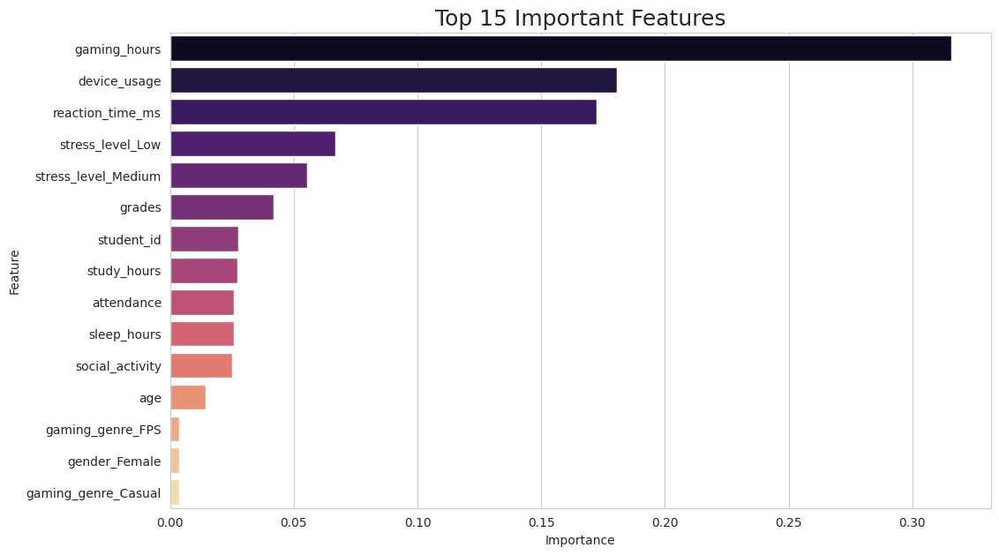


Machine Learning Pipeline Completed Successfully


In [43]:
threshold = df['addiction_score'].median()

df['target'] = np.where(
    df['addiction_score'] >= threshold,
    1,
    0
)

print("\n================ TARGET VALUE COUNTS ================\n")
print(df['target'].value_counts())

X = df.drop(columns=['target', 'addiction_score'])

y = df['target']


categorical_cols = X.select_dtypes(include=['object']).columns.tolist()

numeric_cols = X.select_dtypes(exclude=['object']).columns.tolist()

print("\nCategorical Columns:\n", categorical_cols)

print("\nNumeric Columns:\n", numeric_cols)


X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42,
    stratify=y
)

print("\n================ TRAIN TEST SPLIT ================\n")

print("X_train Shape :", X_train.shape)
print("X_test Shape  :", X_test.shape)

print("y_train Shape :", y_train.shape)
print("y_test Shape  :", y_test.shape)

# Numerical Pipeline
numeric_transformer = Pipeline(steps=[

    ('imputer', SimpleImputer(strategy='median')),

    ('scaler', StandardScaler())

])

# Categorical Pipeline
categorical_transformer = Pipeline(steps=[

    ('imputer', SimpleImputer(strategy='most_frequent')),

    ('encoder', OneHotEncoder(handle_unknown='ignore'))

])

# Combine Pipelines
preprocessor = ColumnTransformer(transformers=[

    ('num', numeric_transformer, numeric_cols),

    ('cat', categorical_transformer, categorical_cols)

])


models = {

    "Logistic Regression":
        LogisticRegression(),

    "Decision Tree":
        DecisionTreeClassifier(random_state=42),

    "Random Forest":
        RandomForestClassifier(random_state=42),

    "Gradient Boosting":
        GradientBoostingClassifier(random_state=42),

    "KNN":
        KNeighborsClassifier(),

    "SVM":
        SVC(probability=True)

}



results = []

plt.figure(figsize=(12,8))

for name, model in models.items():

    print("\n")
    print("="*60)
    print(f"MODEL : {name}")
    print("="*60)

    # Full Pipeline
    clf = Pipeline(steps=[

        ('preprocessor', preprocessor),

        ('model', model)

    ])

    # Train Model
    clf.fit(X_train, y_train)

    # Predictions
    y_pred = clf.predict(X_test)

    # Probability Prediction
    y_prob = clf.predict_proba(X_test)[:,1]

    # ========================================================
    # ACCURACY
    # ========================================================

    accuracy = accuracy_score(y_test, y_pred)

    print("\nAccuracy Score :")
    print(round(accuracy*100,2), "%")

    print("\nClassification Report :\n")

    print(classification_report(y_test, y_pred))



    cm = confusion_matrix(y_test, y_pred)

    print("\nConfusion Matrix :\n")

    print(cm)

    # ========================================================
    # ROC AUC SCORE
    # ========================================================

    auc_score = roc_auc_score(y_test, y_prob)

    print("\nROC AUC Score :")
    print(round(auc_score,4))

    # ========================================================
    # STORE RESULTS
    # ========================================================

    results.append([

        name,
        accuracy,
        auc_score

    ])

    # ========================================================
    # ROC CURVE
    # ========================================================

    fpr, tpr, threshold = roc_curve(y_test, y_prob)

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f'{name} (AUC={auc_score:.2f})'
    )

# ============================================================
# ROC CURVE FINAL PLOT
# ============================================================

plt.plot([0,1], [0,1], linestyle='--')

plt.xlabel("False Positive Rate", fontsize=14)

plt.ylabel("True Positive Rate", fontsize=14)

plt.title("ROC Curve Comparison", fontsize=18)

plt.legend()

plt.grid(True)

plt.show()

# ============================================================
# RESULTS TABLE
# ============================================================

results_df = pd.DataFrame(
    results,
    columns=['Model', 'Accuracy', 'ROC_AUC']
)

results_df = results_df.sort_values(
    by='Accuracy',
    ascending=False
)

print("\n")
print("="*70)
print("FINAL MODEL COMPARISON")
print("="*70)

print(results_df)

# ============================================================
# BARPLOT - MODEL ACCURACY
# ============================================================

plt.figure(figsize=(10,6))

sns.barplot(
    x='Accuracy',
    y='Model',
    data=results_df,
    palette='viridis'
)

plt.title("Model Accuracy Comparison", fontsize=18)

plt.xlabel("Accuracy")

plt.ylabel("Models")

plt.show()

# ============================================================
# BEST MODEL
# ============================================================

best_model = results_df.iloc[0]

print("\n")
print("="*70)
print("BEST MODEL")
print("="*70)

print("Model Name :", best_model['Model'])

print("Accuracy   :", round(best_model['Accuracy']*100,2), "%")

print("ROC AUC    :", round(best_model['ROC_AUC'],4))

# ============================================================
# FEATURE IMPORTANCE (RANDOM FOREST)
# ============================================================

rf_pipeline = Pipeline(steps=[

    ('preprocessor', preprocessor),

    ('model', RandomForestClassifier(random_state=42))

])

rf_pipeline.fit(X_train, y_train)

# Get feature names after encoding
encoded_cat = rf_pipeline.named_steps['preprocessor']\
    .named_transformers_['cat']\
    .named_steps['encoder']\
    .get_feature_names_out(categorical_cols)

all_features = np.concatenate([

    numeric_cols,
    encoded_cat

])

# Feature Importance
importance = rf_pipeline.named_steps['model'].feature_importances_

feature_importance_df = pd.DataFrame({

    'Feature': all_features,
    'Importance': importance

})

feature_importance_df = feature_importance_df.sort_values(
    by='Importance',
    ascending=False
).head(15)

# ============================================================
# FEATURE IMPORTANCE PLOT
# ============================================================

plt.figure(figsize=(12,7))

sns.barplot(
    x='Importance',
    y='Feature',
    data=feature_importance_df,
    palette='magma'
)

plt.title("Top 15 Important Features", fontsize=18)

plt.show()

# ============================================================
# END
# ============================================================

print("\nMachine Learning Pipeline Completed Successfully")